This notebook is part of the repository https://github.com/lsimek/ad1. Its purpose is to produce some alternatives to the graph of the top 100 advertisers, using different criteria or some restrictions.

In [1]:
# standard Python utilities
import itertools
from pathlib import Path
data_path = Path('data/')
flags_path = Path('pixel-flags/flags/')
plots_path = Path('plots/')
cjk_font_path = Path('/usr/share/fonts/opentype/noto/NotoSansCJK-Bold.ttc')
for path in [data_path, flags_path, plots_path]:
    path.mkdir(parents=True, exist_ok=True)

# scientific
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
%matplotlib inline
plt.style.use('https://raw.githubusercontent.com/tinjano/matplotlibrc/main/lavender-dark-thick.mplstyle')
import seaborn as sns

# auxiliary module
import aux

# silence warnings for
# presentation purposes
import warnings
warnings.simplefilter('ignore')

In [2]:
df = pd.read_parquet(data_path/'google-ads-hr-2.parquet')
df_removed = pd.read_parquet(data_path/'google-ads-hr-removed-2.parquet')

In [3]:
df.advertiser_disclosed_name = df.advertiser_disclosed_name.str.strip(' .\/\\\'\"\(\),`[]{};\n\t:')
df.times_shown_upper[df.times_shown_upper > 2 ** 50] = df.times_shown_lower

In [4]:
# name -> location dictionary
loc_dict = (
    df.groupby('advertiser_disclosed_name')
    .agg({'advertiser_location': 'first'})
    .to_dict()
    .get('advertiser_location')
)

In [5]:
def topk(
    df,
    k=100,
    cmp_col='times_shown_lower',
    aggfunc='sum',
    category='ad_format_type',
    sortby='total',
    figsize=(10, 20),
    add_flags=True,
    title='top 100',
    xlabel='times shown',
    shorten_names_threshold=40,  # shorten long names
    legend=True,
    display=True,
    save_path=None
):
    pivoted_df = df.pivot_table(
        values=cmp_col,
        index='advertiser_disclosed_name',
        columns=category,
        aggfunc=aggfunc,
        fill_value=0
    )

    pivoted_df['total'] = pivoted_df.sum(axis=1)

    pivoted_df = (
        pivoted_df
        .sort_values(by=sortby, ascending=False)
        .iloc[:k, :]
        .sort_values(by=sortby, ascending=True)
    )

    y = [aux.shorten(name, shorten_names_threshold) for name in pivoted_df.index]
    left = np.zeros(pivoted_df.shape[0])

    fig, ax = plt.subplots(figsize=figsize)

    # draw stacked bars
    # monkey patch solution to map colors to categories always in the same way when ad_format_type is the category
    for category in df[category].unique() if category != 'ad_format_type' else ['text', 'image', 'video']:
        width = pivoted_df[category]
        ax.barh(y=y, width=width, left=left, label=category)
        left += width
    
    plt.draw()
    
    oom = vars(ax.get_xaxis().get_major_formatter()).get('orderOfMagnitude')
    for i, (total, advertiser_disclosed_name, ticklabel) in enumerate(zip(pivoted_df.total, pivoted_df.index, ax.get_yticklabels())):
        # add value labels to the right of bars
        text = f'{total/10**oom:.2f}' if oom > 1 else str(total)
        ax.text(total, i, text, ha='left', va='center', size='smaller')

        if aux.contains_cjk(ticklabel.get_text()):
            try:
                ticklabel.set_font(cjk_font_path)
            except FileNotFoundError:
                pass

        if not add_flags:
            continue
            
        # place country flags before names
        location = loc_dict.get(advertiser_disclosed_name)
        try:
            abbrev = aux.country_to_abbrev.get(location).lower()
            flag_image = plt.imread(flags_path/f'{abbrev}.png')
        except (FileNotFoundError, AttributeError, KeyError):
            continue
    
        window_extent = ticklabel.get_window_extent().transformed(ax.transData.inverted())
        x0, y0, x1, y1 = window_extent.get_points().flatten()
        
        imh, imw = flag_image.shape[:2]
        
        zoom = (ticklabel.get_fontsize() * 0.8) / imh
        flag_offsetbox = OffsetImage(flag_image, zoom=zoom)
        
        flag_artist = AnnotationBbox(flag_offsetbox, xy=(0, 0), xybox=(x0, i), boxcoords='data', frameon=False, box_alignment=(1.1, 0.5))
        ax.add_artist(flag_artist)
    
    # colloquialize offset label
    # note: offset_label.set_text('...') or
    # offset_label.get_text().set_text('...') wont work
    offset_label = ax.get_xaxis().get_offset_text()
    offset_label_text = offset_label.get_text()
    x, y, _, _ =  offset_label.get_window_extent().get_points().flatten()
    x, y = ax.transData.inverted().transform((x, y))
    
    ax.text(x, y, aux.humanize_dict.get(offset_label_text))
    ax.xaxis.offsetText.set_visible(False)
    
    ax.set(
        title=title,
        xlabel=xlabel,
    )

    if legend:
        ax.legend()
    
    if save_path is not None:
        plt.savefig(plots_path/save_path, bbox_inches='tight')

    if not display:
        plt.close()

# Different Criteria
- total ads published
- number of impressions per ad published

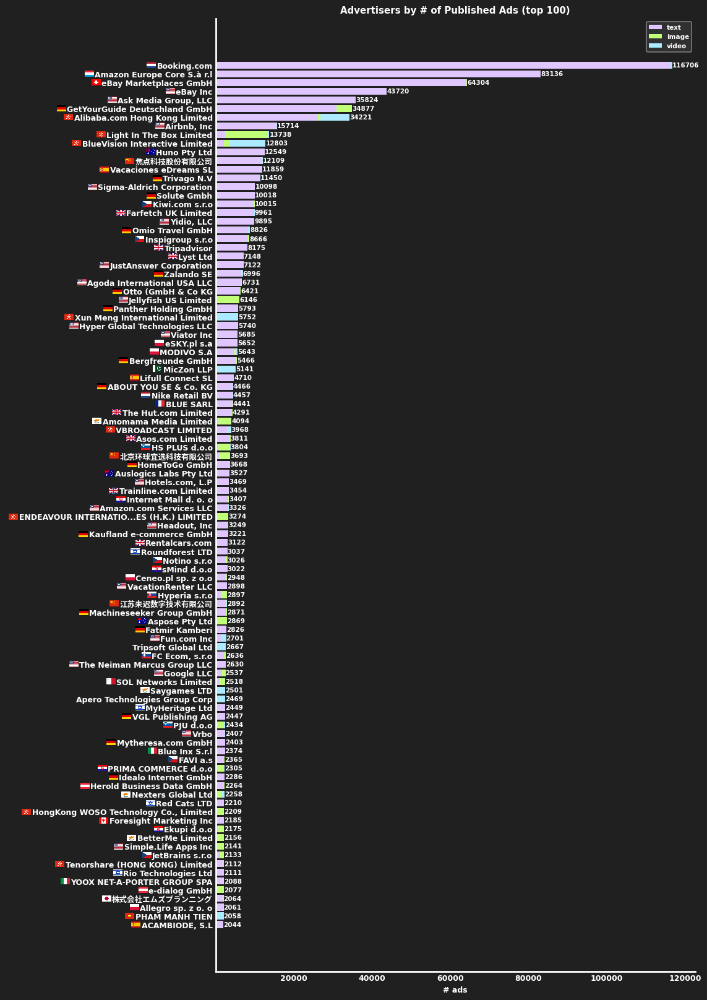

In [6]:
topk(
    df,
    cmp_col='creative_page_url',
    aggfunc='count',
    title='Advertisers by # of Published Ads (top 100)',
    xlabel='# ads',
    save_path='top100-bycount.png'
)

In [7]:
df['dummy_category'] = [0] * len(df)

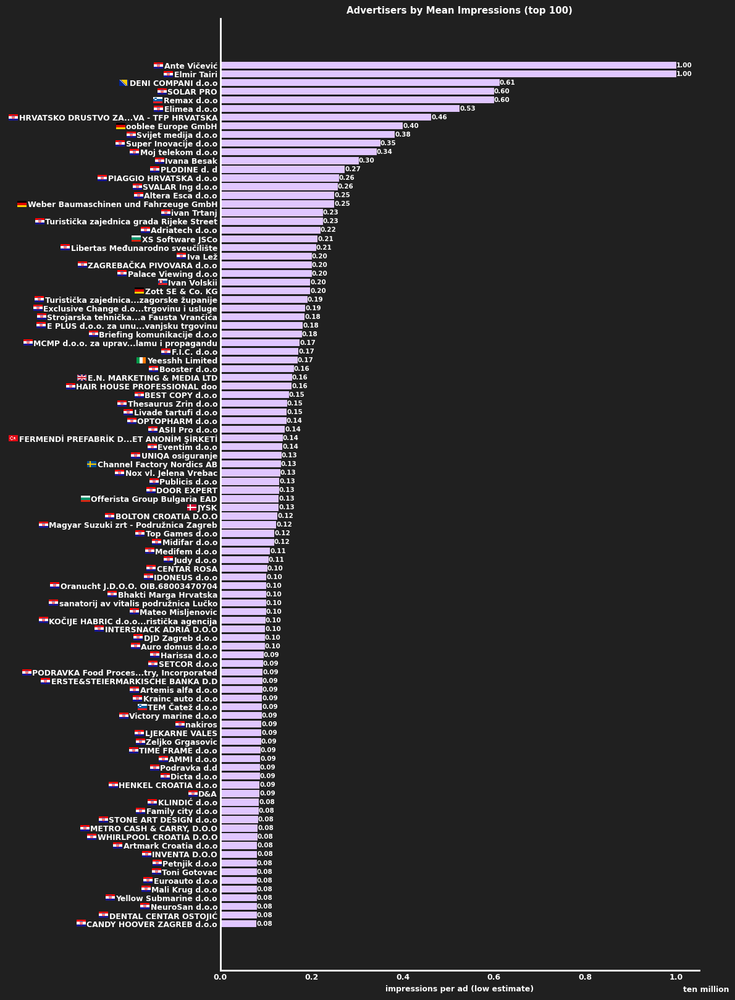

In [8]:
topk(
    df,
    cmp_col='times_shown_lower',
    category='dummy_category',
    aggfunc='mean',
    title='Advertisers by Mean Impressions (top 100)',
    xlabel='impressions per ad (low estimate)',
    legend=False,
    save_path='top100-bymeanimpressions.png'
)

# Specific Formats

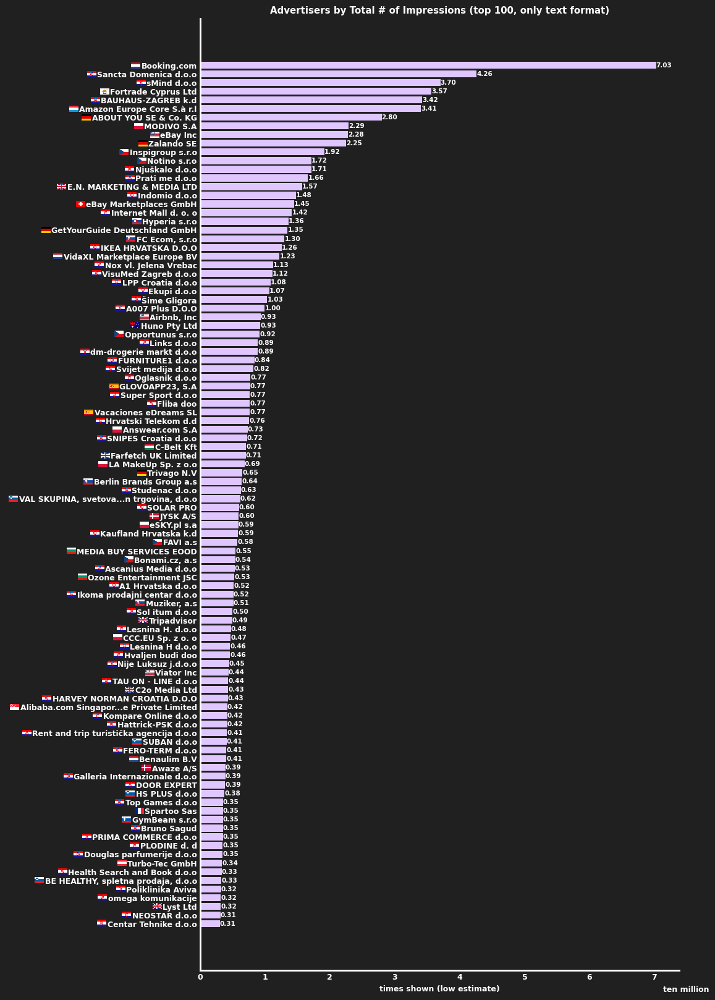

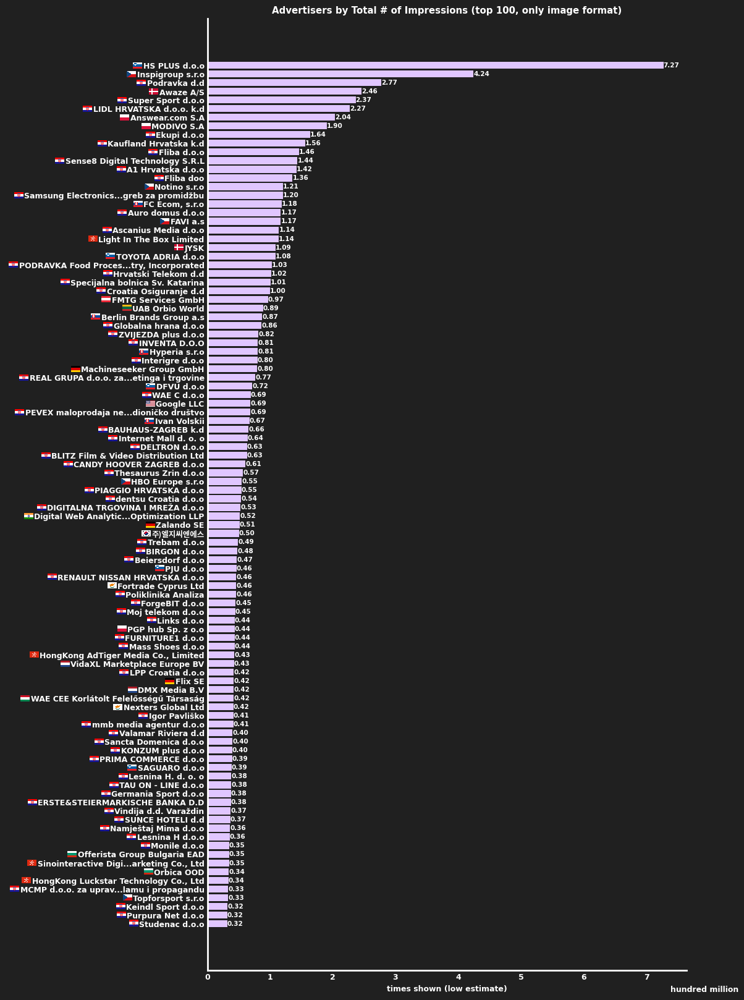

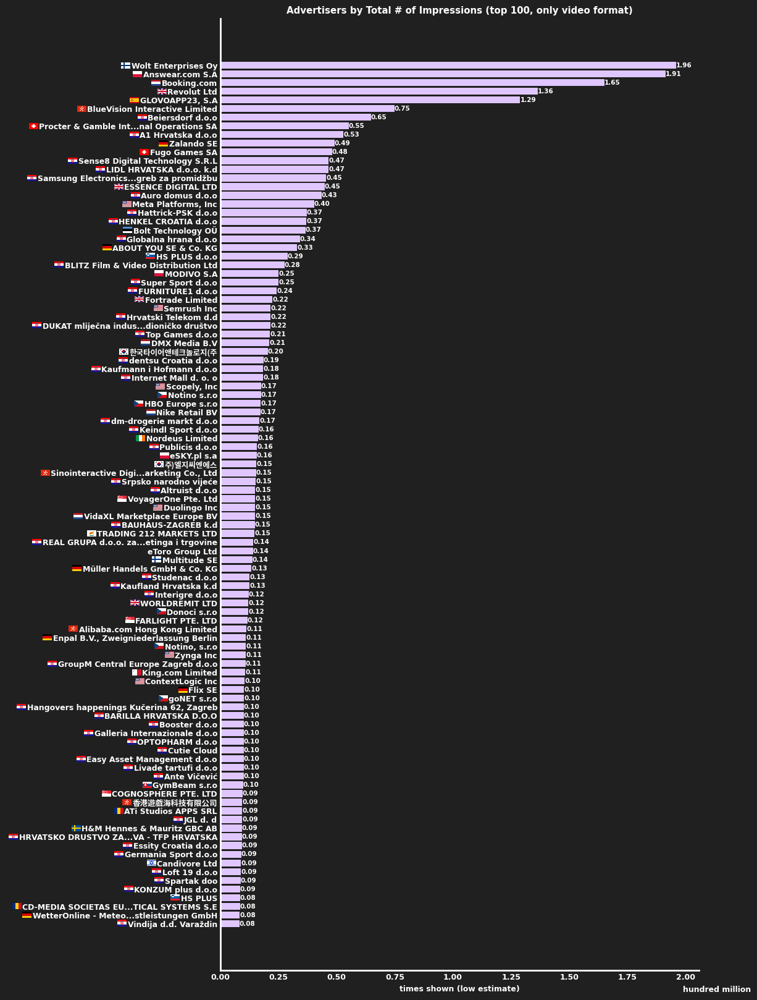

In [9]:
for ad_format_type in df.ad_format_type.unique():
    topk(
        df[df.ad_format_type == ad_format_type],
        category='dummy_category',
        title=f'Advertisers by Total # of Impressions (top 100, only {ad_format_type} format)',
        xlabel='times shown (low estimate)',
        legend=False,
        save_path=f'top100-{ad_format_type}.png'
    )

# Specific Locations

In [10]:
advertiser_locations = ['Croatia', 'Hong Kong', 'Cyprus', 'Virgin Islands (UK)', 'Switzerland']

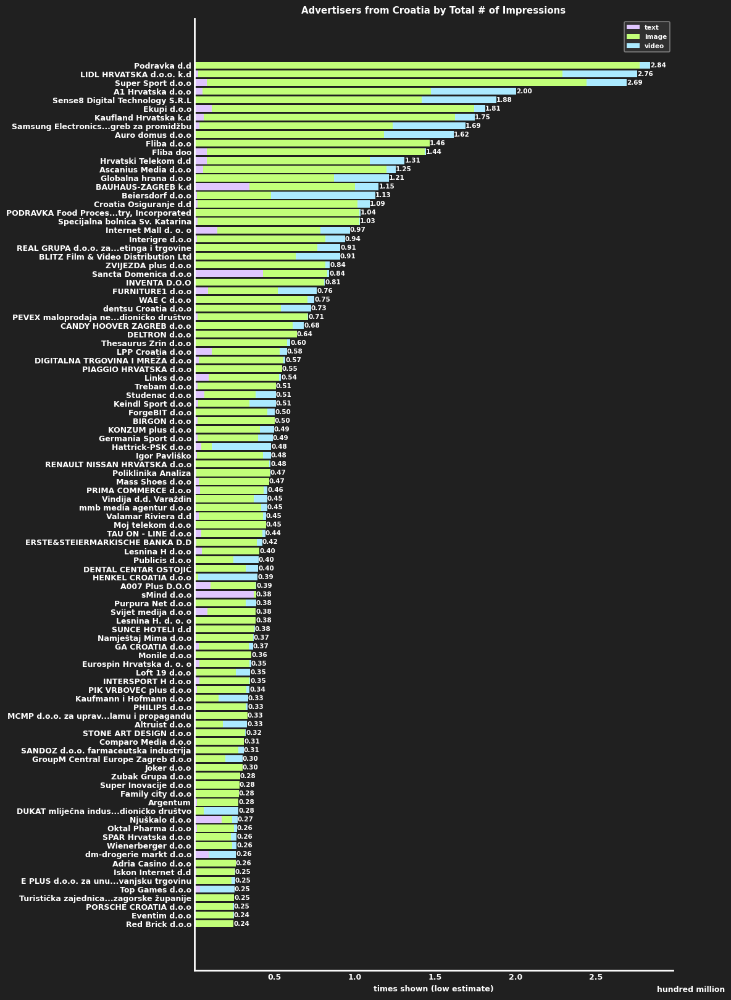

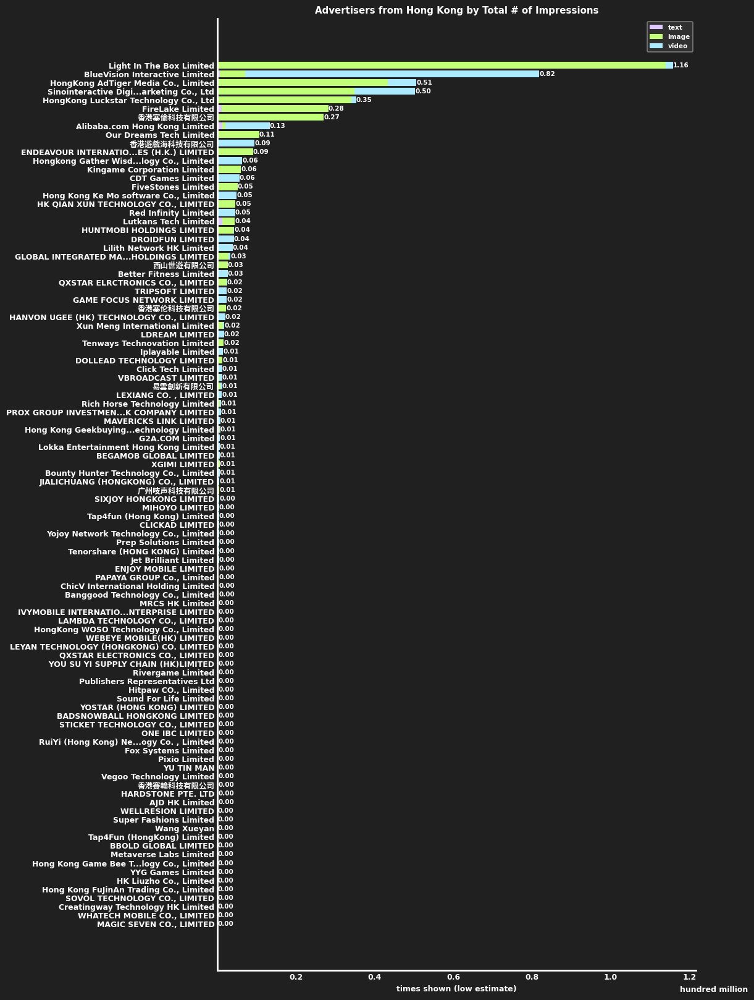

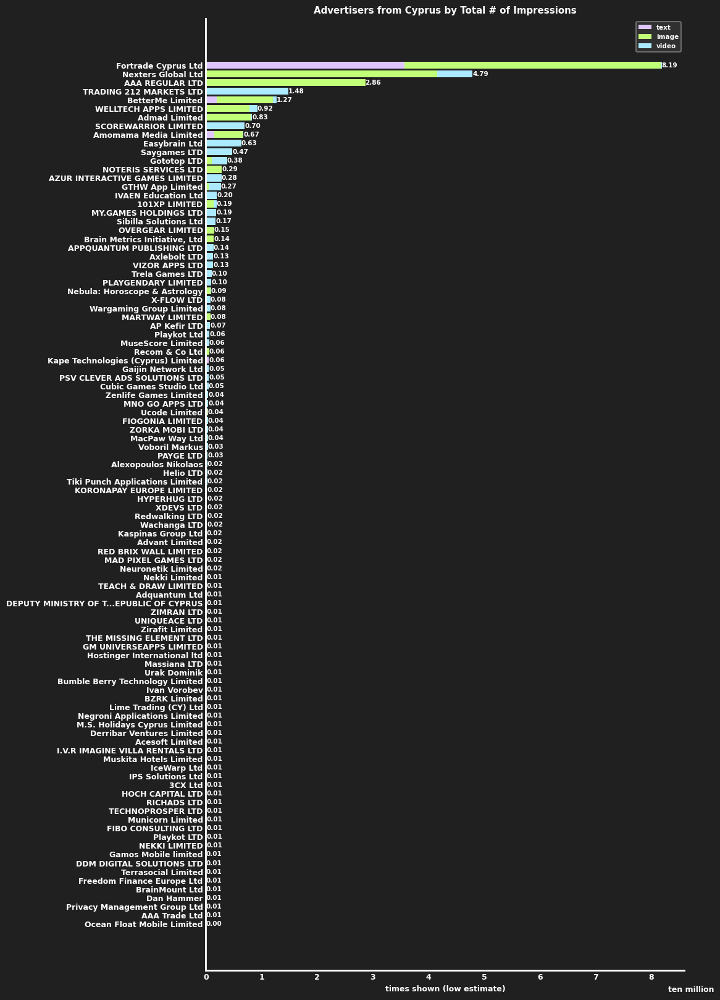

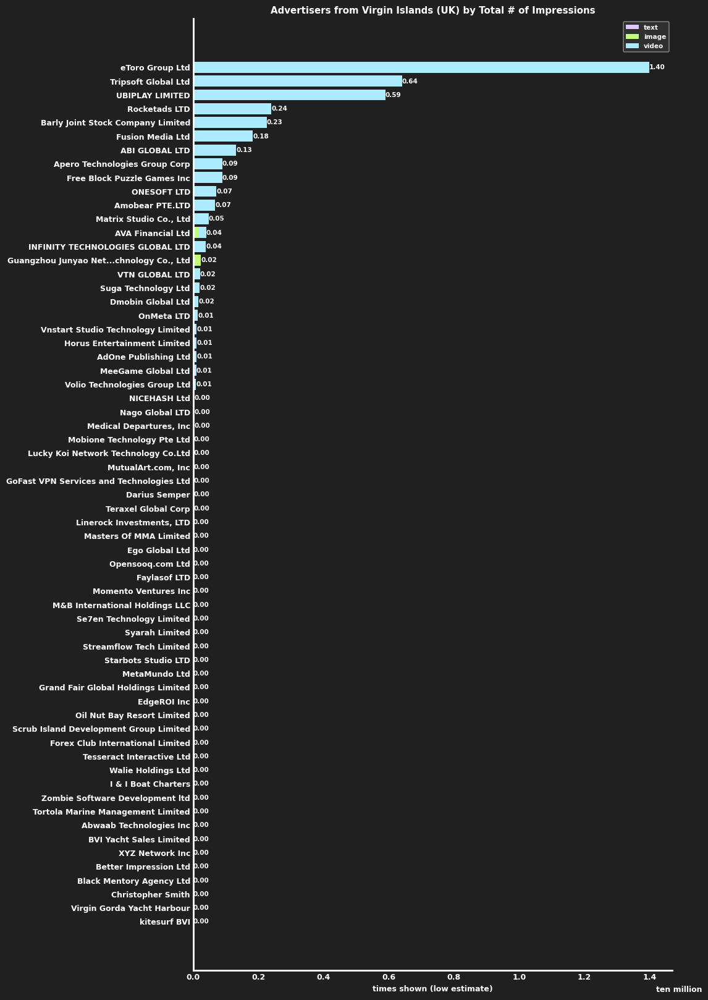

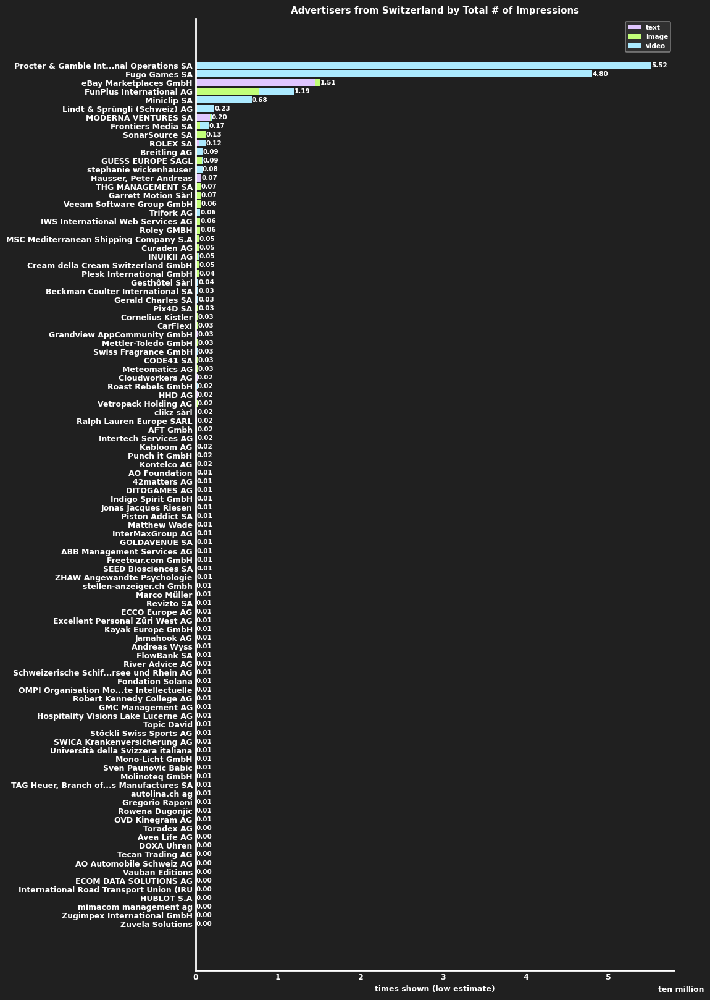

In [11]:
for advertiser_location in advertiser_locations:
    topk(
        df[df.advertiser_location == advertiser_location],
        add_flags=False,
        title=f'Advertisers from {advertiser_location} by Total # of Impressions',
        xlabel='times shown (low estimate)',
        save_path=f'top100-{advertiser_location}.png'
    )

# Specific Topics

In [12]:
threshold = 1000
srs = df.topic.value_counts()

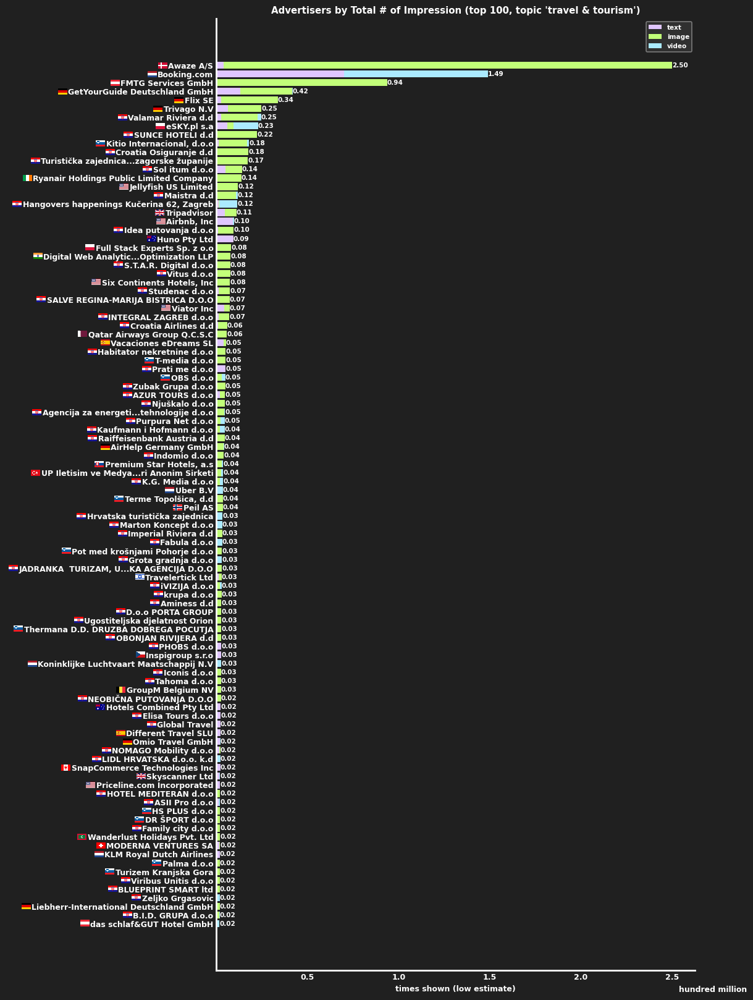

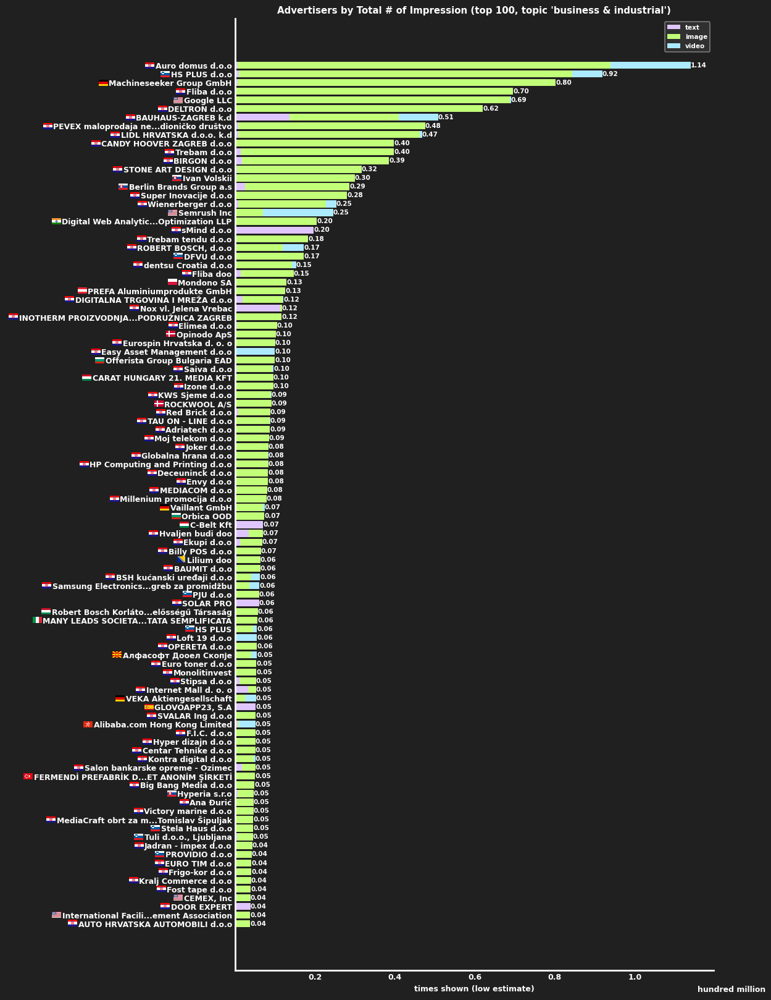

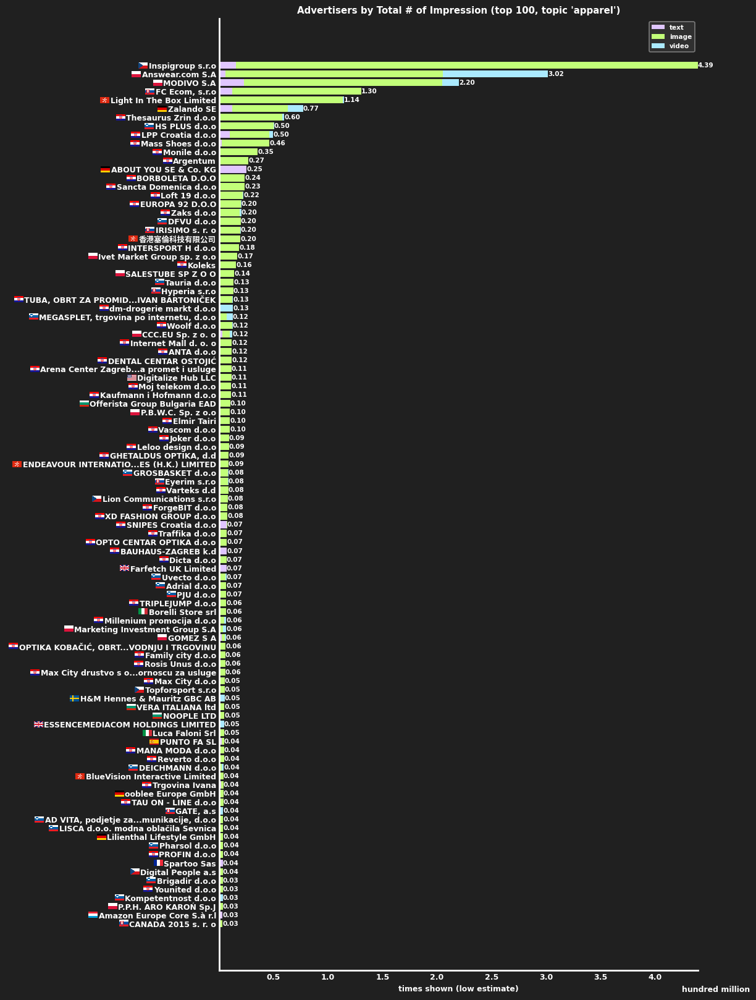

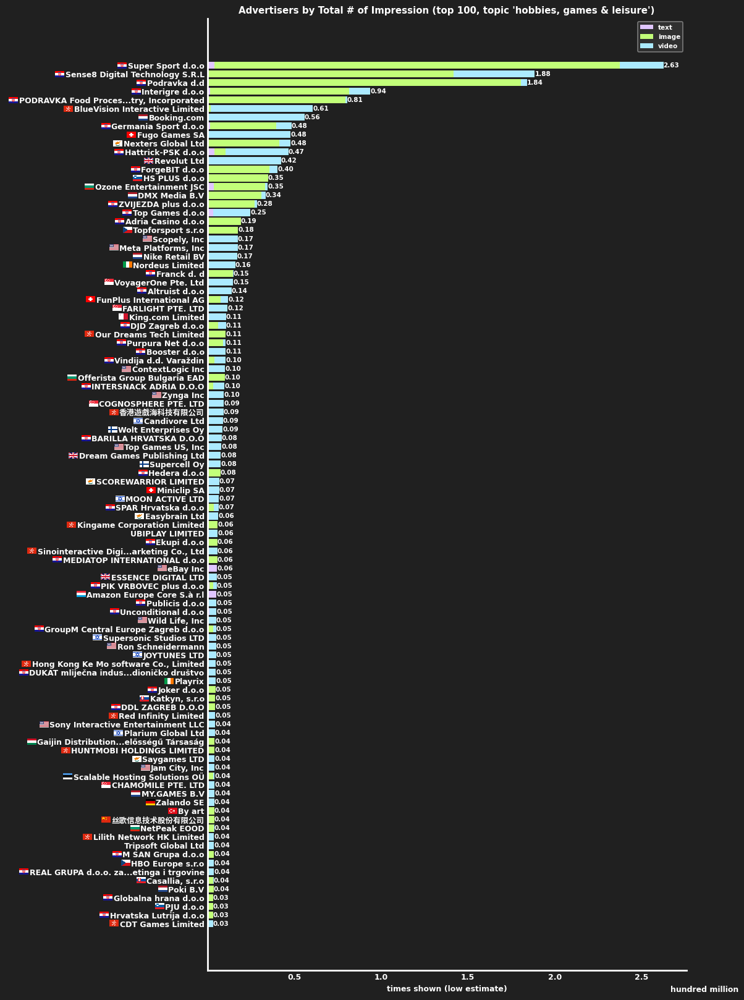

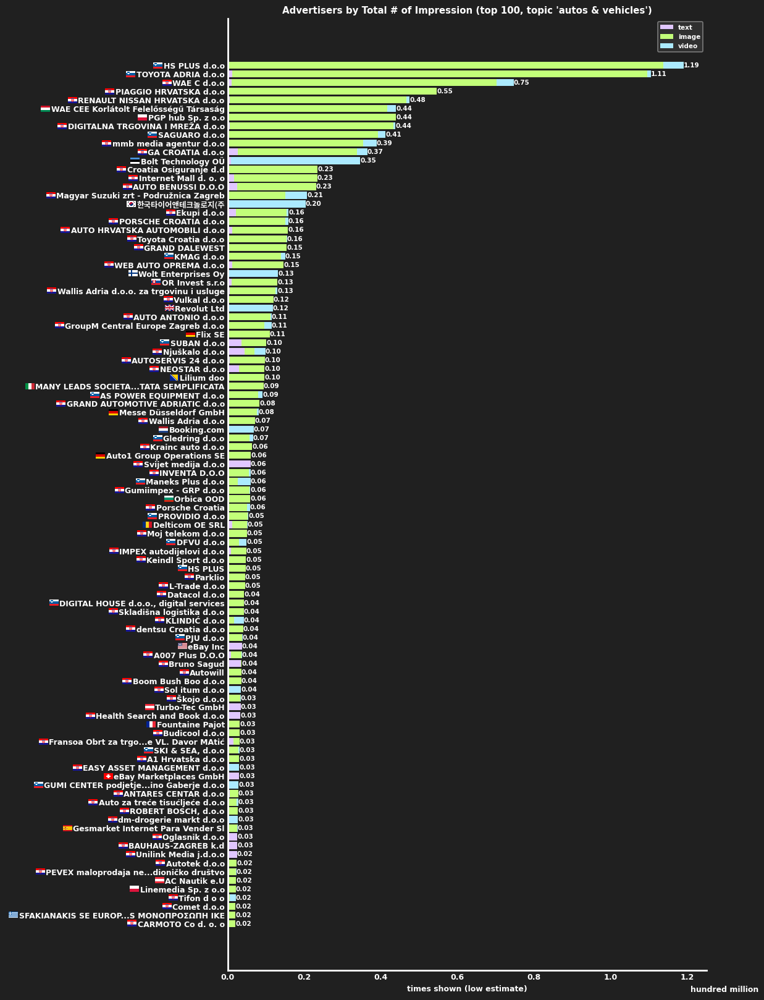

...

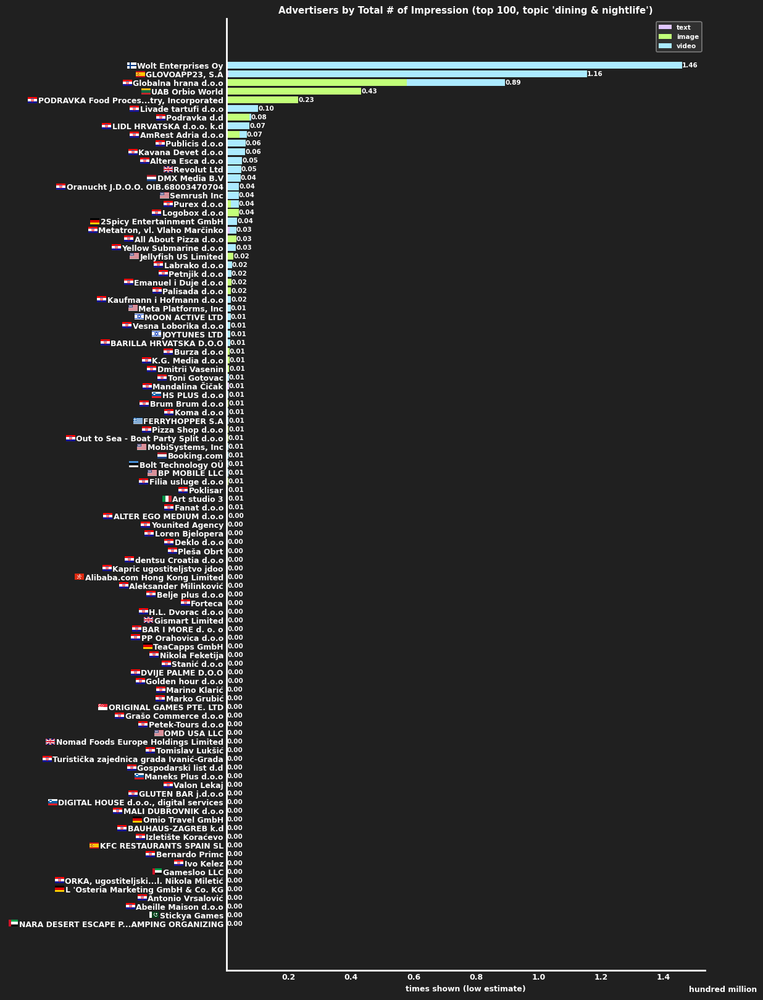

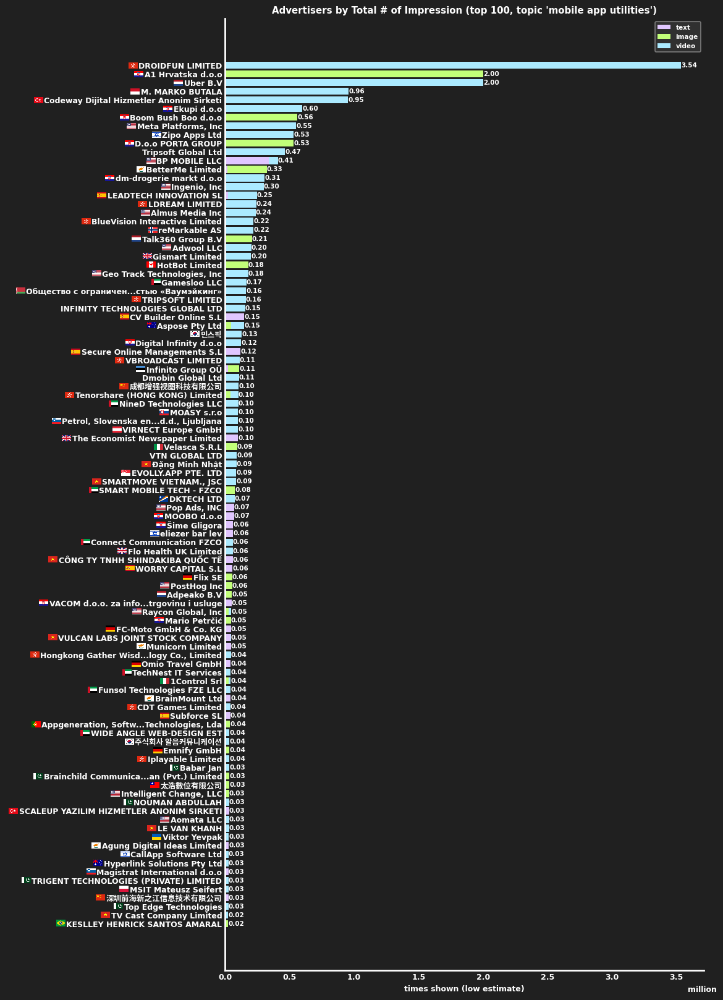

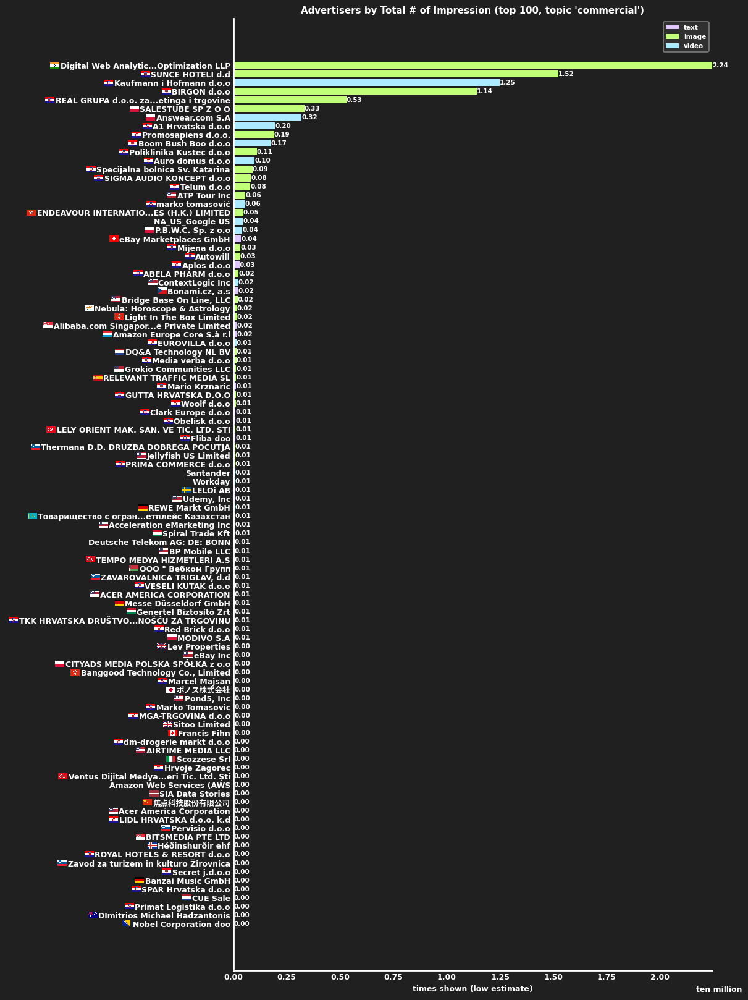

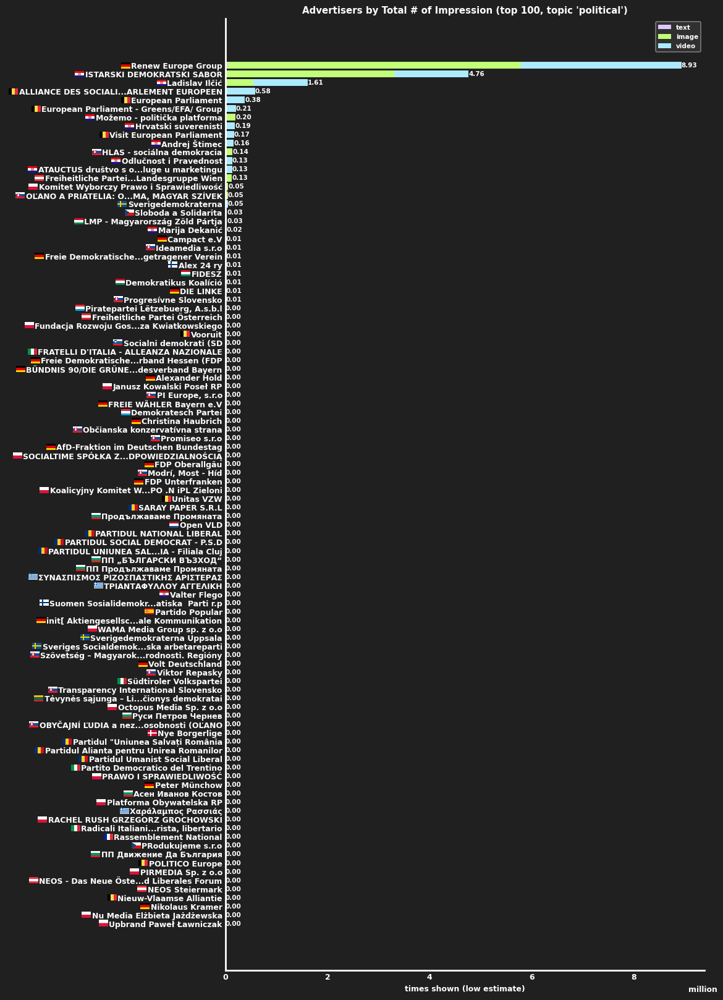

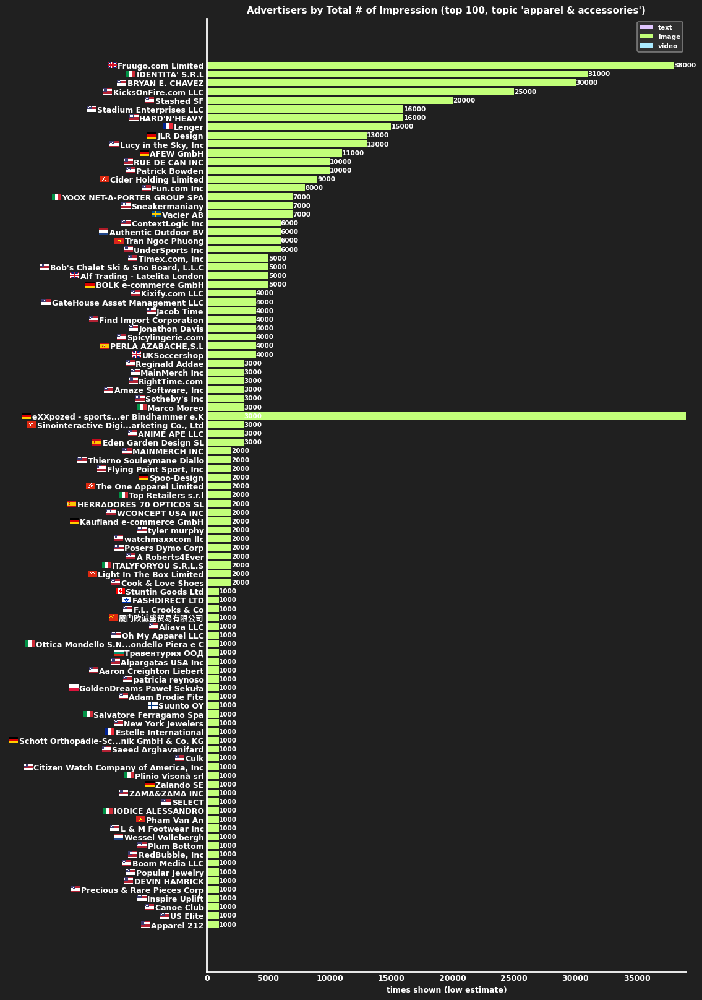

In [13]:
for topic in srs[srs.values > 1000].index:
    topk(
        df[df.topic == topic],
        title=f'Advertisers by Total # of Impression (top 100, topic \'{topic}\')',
        xlabel='times shown (low estimate)',
        save_path=f'top100-topic-{topic}.png'
    )

# Unverified

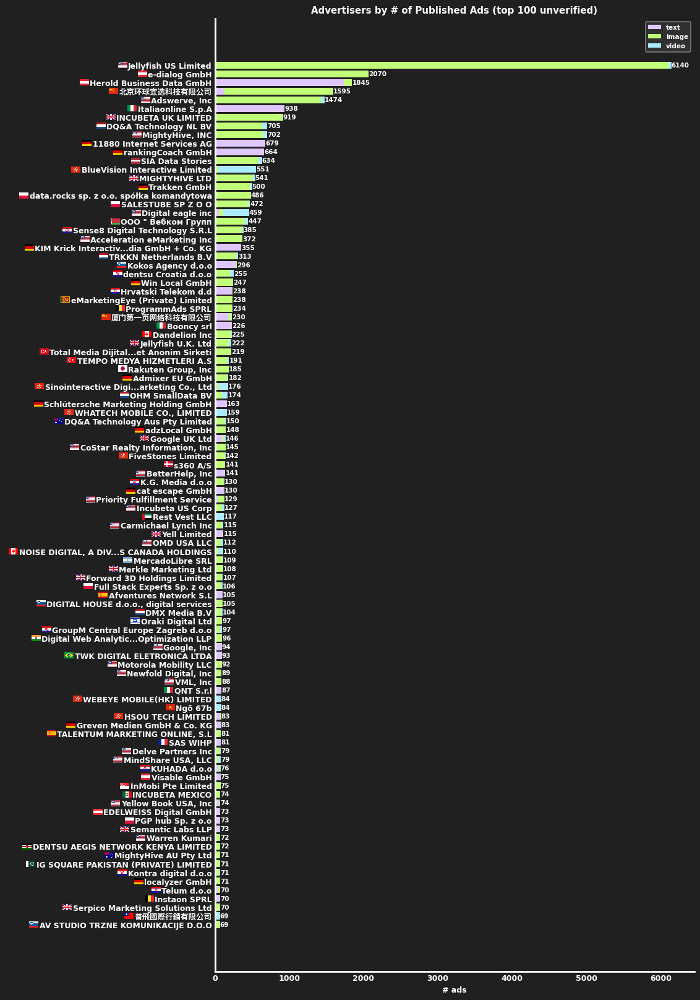

In [14]:
topk(
    df[df.advertiser_verification_status == 'unverified'],
    cmp_col='creative_page_url',
    aggfunc='count',
    title='Advertisers by # of Published Ads (top 100 unverified)',
    xlabel='# ads',
    save_path='top100-unverified.png'
)